In [137]:
# libraries
import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

In [134]:
# 1. Warehouse robot environment
class WarehouseRobotEnv:
    def __init__(self):
        self.grid_size = 6

        # Pickup and drop-off points
        self.pickup_locations = [(0, 5), (1, 0), (1, 2), (2, 3)]
        self.dropoff_locations = [(5, 0), (3, 2)]

        # Obstacles
        self.obstacles = [(1, 1), (4, 2), (2, 4), (3, 4)]

        self.starting_position = (0, 0)
        self.current_state = (0, 0, False)
        self.done = False

        # actions
        self.actions = ["UP", "DOWN", "LEFT", "RIGHT"]

        # Loading images for visualization (images were created using DALl-E)
        self.robot_img_idle = Image.open("robot_idle.png")
        self.robot_img_carrying = Image.open("robot_carrying.png")
        self.pickup_img = Image.open("pickup.png")
        self.dropoff_img = Image.open("dropoff.png")
        self.obstacle_img = Image.open("obstacle.png")
        self.background_img = Image.open("background2.png")

    def reset(self):
        self.current_state = self.starting_position + (False,)  # initial position and not carrying anything
        self.done = False
        return self.current_state

    def step(self, action):
        x, y, carrying = self.current_state
        new_x, new_y = x, y
        reward = -1  # penalty
        status = "Moved"

        # Movement actions with boundary and obstacle
        if action == "UP":
            if x > 0:
                if (x - 1, y) in self.obstacles:
                    status = "Hit Obstacle"
                    reward = -20
                else:
                    new_x -= 1
            else:
                status = "Boundary Hit"
        elif action == "DOWN":
            if x < self.grid_size - 1:
                if (x + 1, y) in self.obstacles:
                    status = "Hit Obstacle"
                    reward = -20
                else:
                    new_x += 1
            else:
                status = "Boundary Hit"
        elif action == "LEFT":
            if y > 0:
                if (x, y - 1) in self.obstacles:
                    status = "Hit Obstacle"
                    reward = -20
                else:
                    new_y -= 1
            else:
                status = "Boundary Hit"
        elif action == "RIGHT":
            if y < self.grid_size - 1:
                if (x, y + 1) in self.obstacles:
                    status = "Hit Obstacle"
                    reward = -20
                else:
                    new_y += 1
            else:
                status = "Boundary Hit"

        # Updating state
        self.current_state = (new_x, new_y, carrying)

        # Checking for pickup
        if (new_x, new_y) in self.pickup_locations and not carrying:
            carrying = True
            reward = 25
            status = "Picked Up Item"

        # Checking for drop-off
        elif (new_x, new_y) in self.dropoff_locations and carrying:
            carrying = False
            reward = 100  # Reward
            self.done = True
            status = "Delivered Item"

        # Update state with carrying status
        self.current_state = (new_x, new_y, carrying)

        return self.current_state, reward, self.done, status

    def render(self, action=None, reward=None, status=""):
        fig, ax = plt.subplots(figsize=(8, 8))

        # Background
        ax.imshow(self.background_img, extent=[0, self.grid_size, 0, self.grid_size], aspect="auto")

        # Grid
        for i in range(self.grid_size + 1):
            ax.plot([i, i], [0, self.grid_size], color="black", linewidth=0.5)
            ax.plot([0, self.grid_size], [i, i], color="black", linewidth=0.5)

        # Obstacles
        for x, y in self.obstacles:
            ax.imshow(self.obstacle_img, extent=(y, y + 1, self.grid_size - x - 1, self.grid_size - x))

        # Pickup and dropoff locations
        for px, py in self.pickup_locations:
            ax.imshow(self.pickup_img, extent=(py, py + 1, self.grid_size - px - 1, self.grid_size - px))
        for dx, dy in self.dropoff_locations:
            ax.imshow(self.dropoff_img, extent=(dy, dy + 1, self.grid_size - dx - 1, self.grid_size - dx))

        # Robot state
        rx, ry, carrying = self.current_state
        robot_img = self.robot_img_carrying if carrying else self.robot_img_idle
        ax.imshow(robot_img, extent=(ry, ry + 1, self.grid_size - rx - 1, self.grid_size - rx))

        plt.xlim(0, self.grid_size)
        plt.ylim(0, self.grid_size)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.title(f"Robot Position: ({rx}, {ry}), Carrying: {'Yes' if carrying else 'No'}")
        print(f"Action: {action}, Reward: {reward}, Status: {status}")
        plt.show()



#### 2. Run the agent for 20 timesteps


Action: LEFT, Reward: -1, Status: Boundary Hit


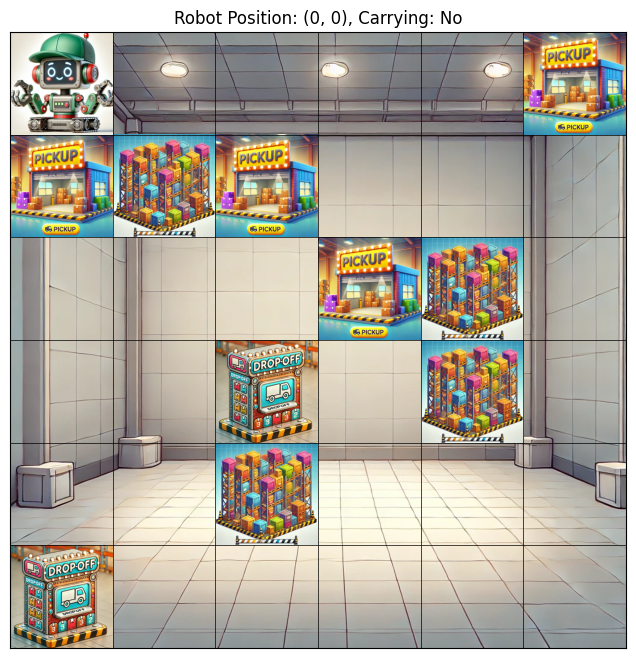

Action: DOWN, Reward: 25, Status: Picked Up Item


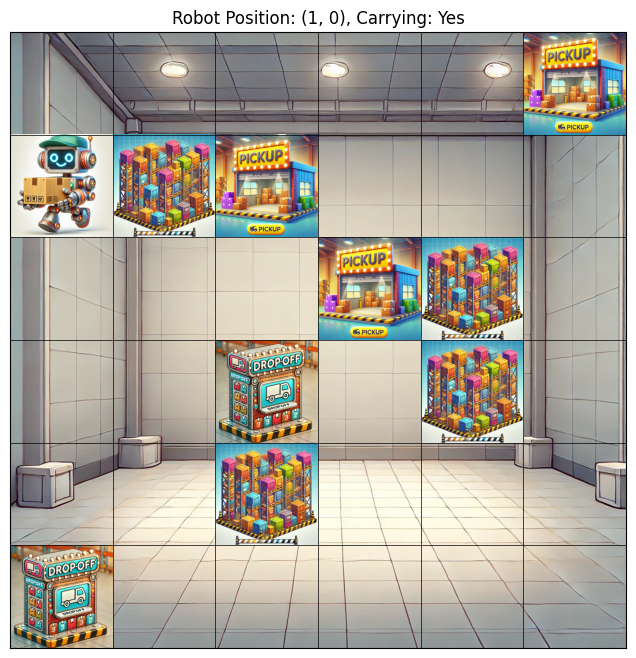

Action: RIGHT, Reward: -20, Status: Hit Obstacle


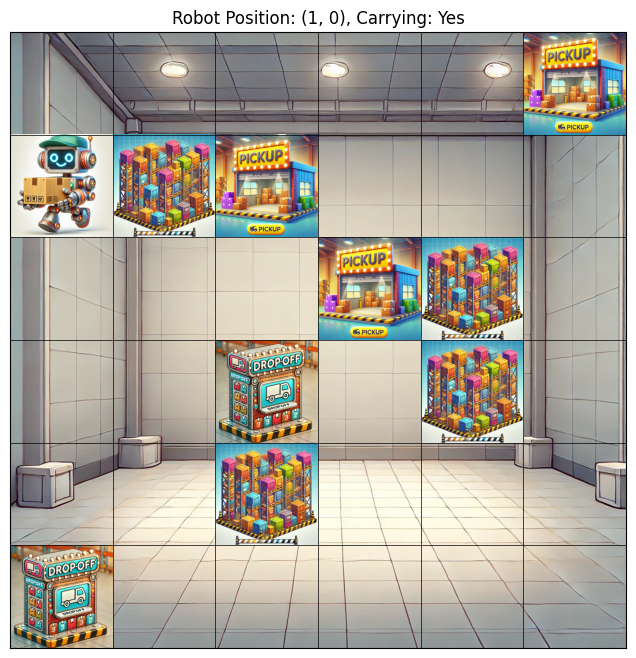

Action: LEFT, Reward: -1, Status: Boundary Hit


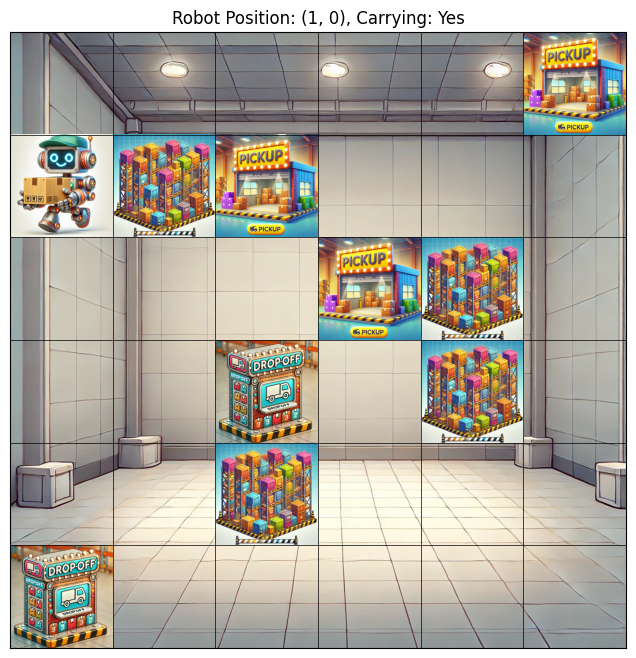

Action: RIGHT, Reward: -20, Status: Hit Obstacle


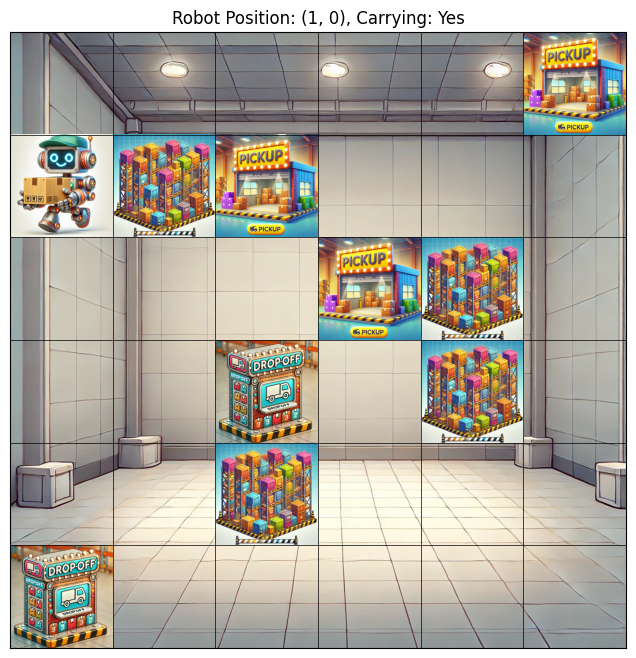

Action: UP, Reward: -1, Status: Moved


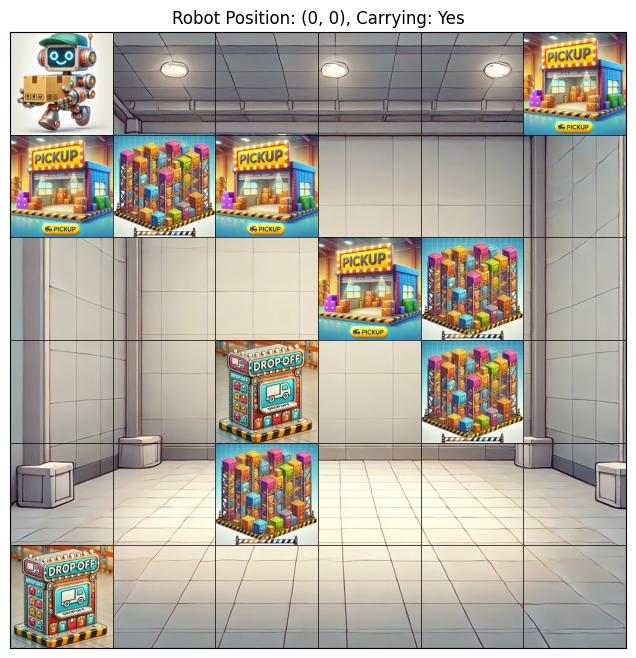

Action: LEFT, Reward: -1, Status: Boundary Hit


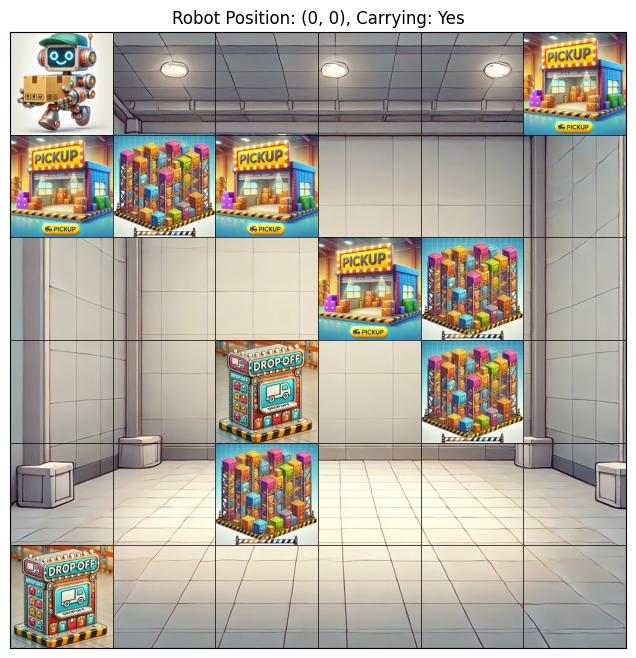

Action: RIGHT, Reward: -1, Status: Moved


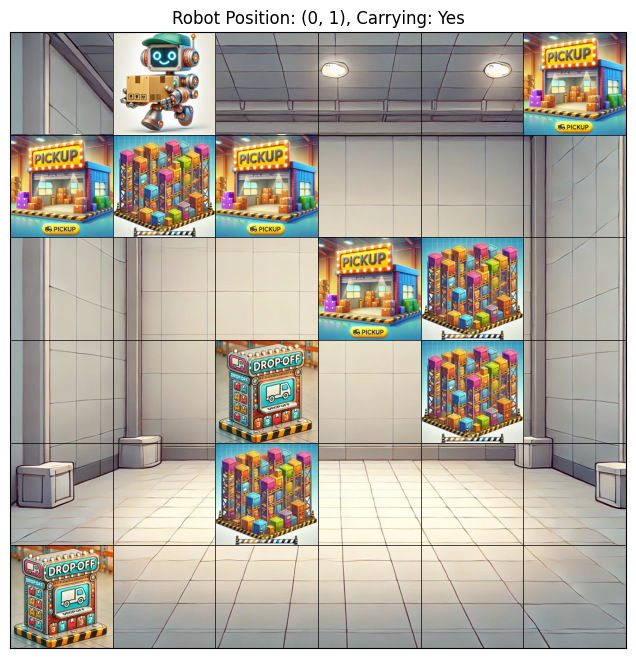

Action: RIGHT, Reward: -1, Status: Moved


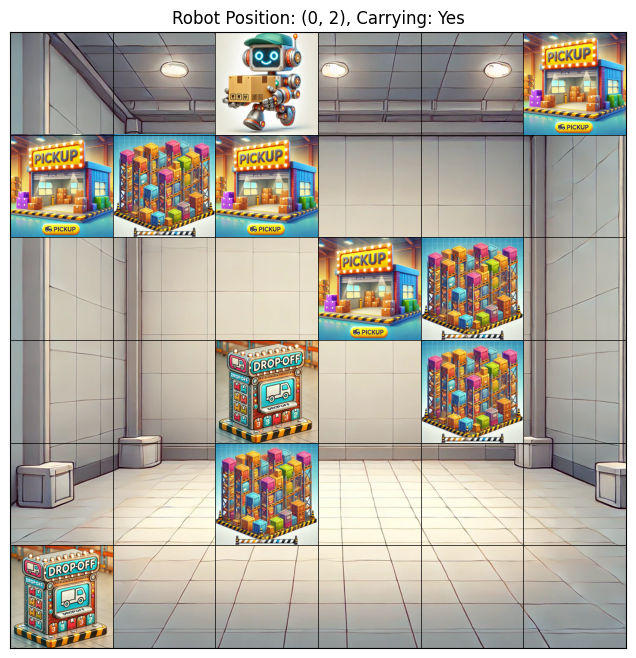

Action: RIGHT, Reward: -1, Status: Moved


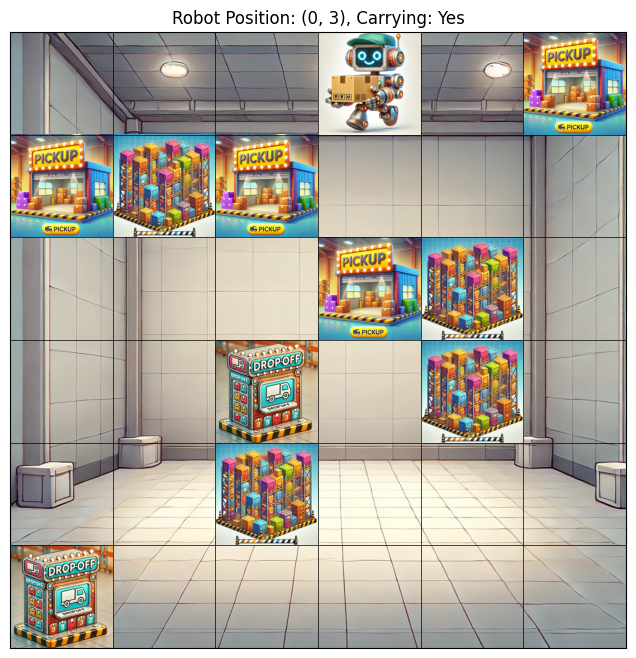

Action: DOWN, Reward: -1, Status: Moved


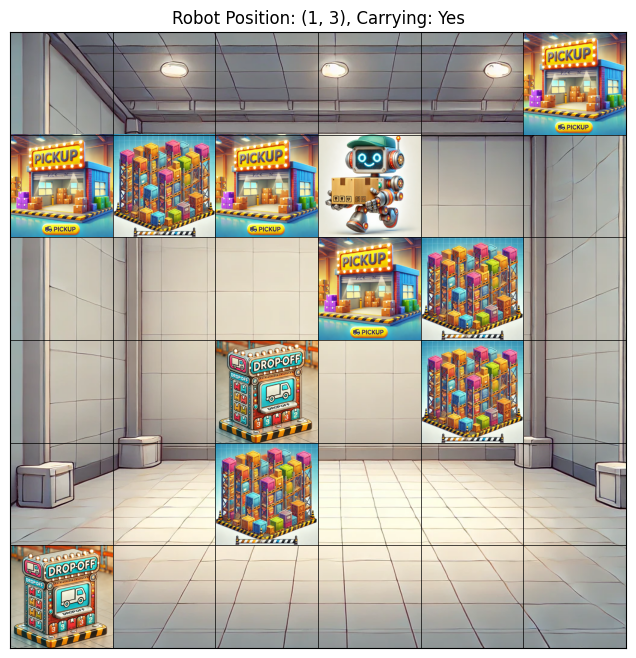

Action: UP, Reward: -1, Status: Moved


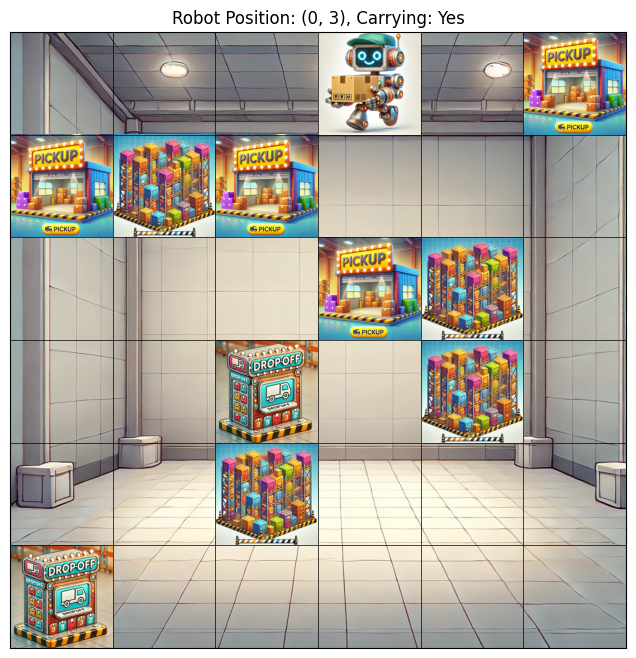

Action: LEFT, Reward: -1, Status: Moved


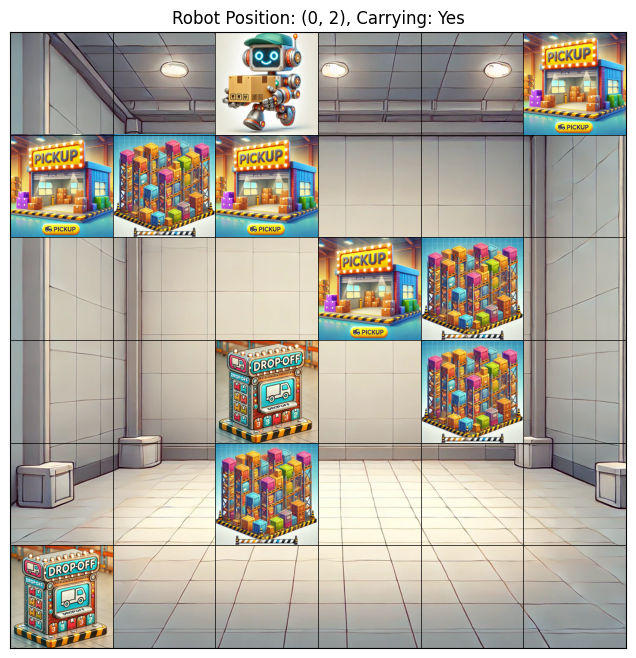

Action: DOWN, Reward: -1, Status: Moved


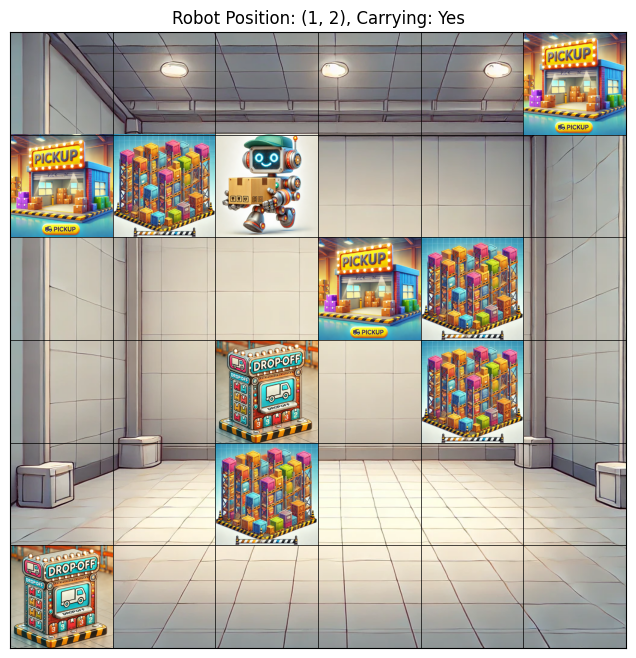

Action: LEFT, Reward: -20, Status: Hit Obstacle


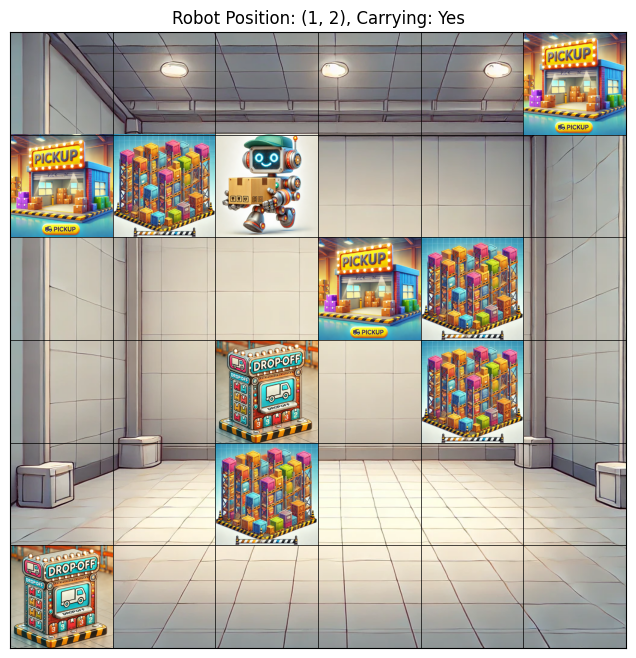

Action: UP, Reward: -1, Status: Moved


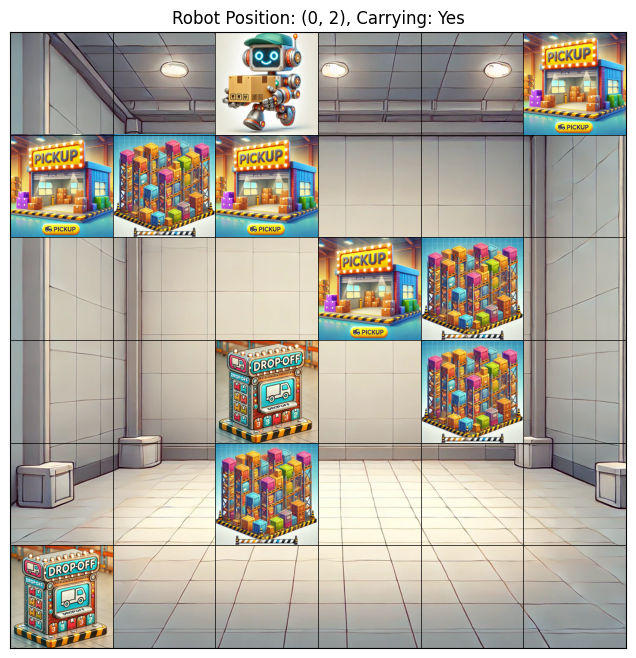

Action: UP, Reward: -1, Status: Boundary Hit


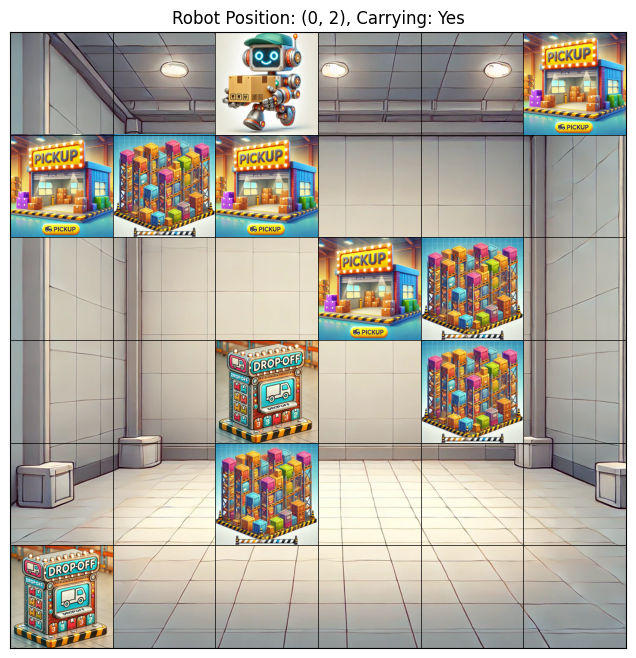

Action: UP, Reward: -1, Status: Boundary Hit


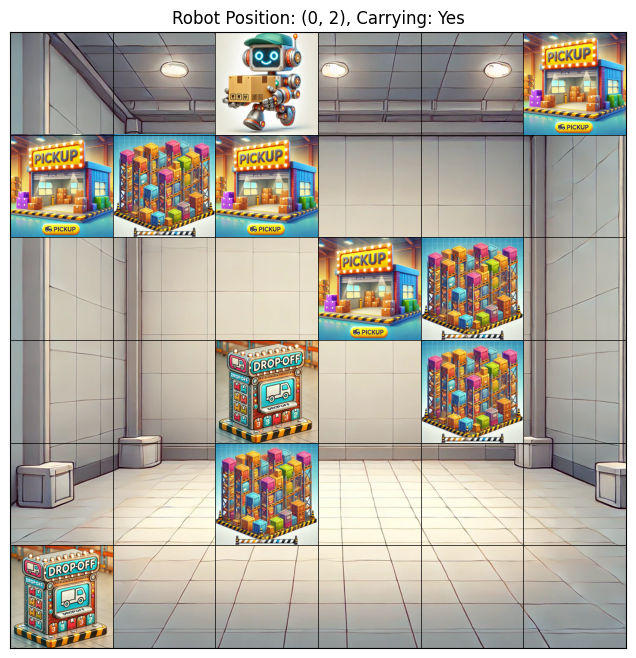

Action: LEFT, Reward: -1, Status: Moved


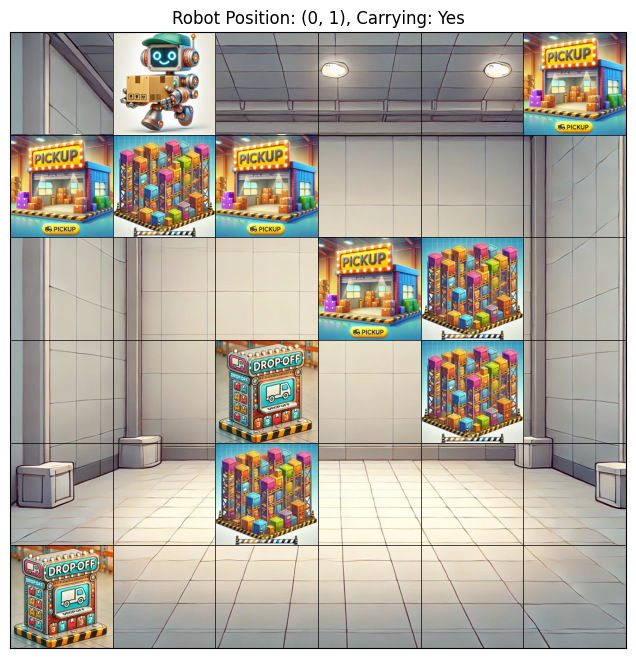

Action: UP, Reward: -1, Status: Boundary Hit


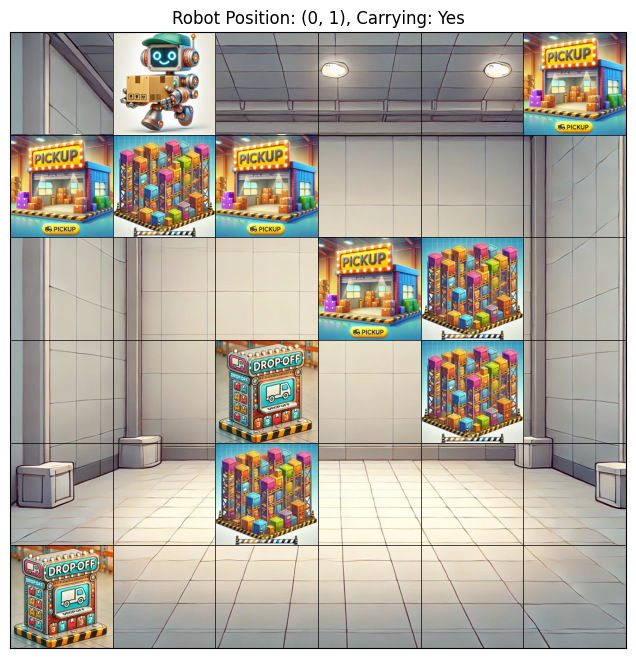

In [135]:
# Test the Environment
env = WarehouseRobotEnv()
env.reset()

# Run robot for random actions
for _ in range(20):
    action = random.choice(env.actions)
    state, reward, done, status = env.step(action)
    env.render(action=action, reward=reward, status=status)
    if done:
        print("Task complete!")
        break

***3. Solving Environment Using SARSA***

In [129]:
# SARSA Parameters
alpha = 0.1  # Learning rate
gamma = 0.99  # Discount factor
epsilon = 1.0
epsilon_decay = 0.995  # Decay rate
min_epsilon = 0.01  # Minimum epsilon
num_episodes = 1000  # Number of training episodes
max_timesteps = 500  # Maximum steps per episode

# Initializing Q-table
Q_table = {}
for x in range(env.grid_size):
    for y in range(env.grid_size):
        for carrying in [False, True]:
            Q_table[(x, y, carrying)] = {action: 0.0 for action in env.actions}

# Initial Q-table for comparison
initial_Q_table = {state: actions.copy() for state, actions in Q_table.items()}

rewards_per_episode = []

for episode in range(num_episodes):
    env.reset()
    state = env.current_state
    total_reward = 0
    timestep = 0

    # Choosing action using epsilon-greedy policy
    if random.uniform(0, 1) < epsilon:
        action = random.choice(env.actions)
    else:
        action = max(Q_table[state], key=Q_table[state].get)

    done = False
    while not done and timestep < max_timesteps:
        next_state, reward, done, status = env.step(action)
        total_reward += reward
        timestep += 1

        # Choose next action
        if random.uniform(0, 1) < epsilon:
            next_action = random.choice(env.actions)
        else:
            next_action = max(Q_table[next_state], key=Q_table[next_state].get)

        # SARSA Q-value update
        Q_table[state][action] += alpha * (reward + gamma * Q_table[next_state][next_action] - Q_table[state][action])

        state = next_state
        action = next_action

    # Decay epsilon
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

    rewards_per_episode.append(total_reward)

    if episode % 100 == 0:
        print(f"Episode {episode}: Total Reward: {total_reward}")


Episode 0: Total Reward: -227
Episode 100: Total Reward: 119
Episode 200: Total Reward: 122
Episode 300: Total Reward: 100
Episode 400: Total Reward: 122
Episode 500: Total Reward: 122
Episode 600: Total Reward: 122
Episode 700: Total Reward: 122
Episode 800: Total Reward: 122
Episode 900: Total Reward: 122


In [130]:
# 3(a):
# Initial Q-Table
print("\nInitial Q-Table:")
for state, actions in initial_Q_table.items():
    print(f"State {state}: {actions}")

# Trained Q-Table
print("\nTrained Q-Table:")
for state, actions in Q_table.items():
    print(f"State {state}: {actions}")


Initial Q-Table:
State (0, 0, False): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 0, True): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 1, False): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 1, True): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 2, False): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 2, True): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 3, False): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 3, True): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 4, False): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 4, True): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 5, False): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (0, 5, True): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (1, 0, False): {'UP': 0.0, 'DOWN': 0.0, 'LEFT': 0.0, 'RIGHT': 0.0}
State (1, 0, True): {'UP': 0.0, 'DOWN':

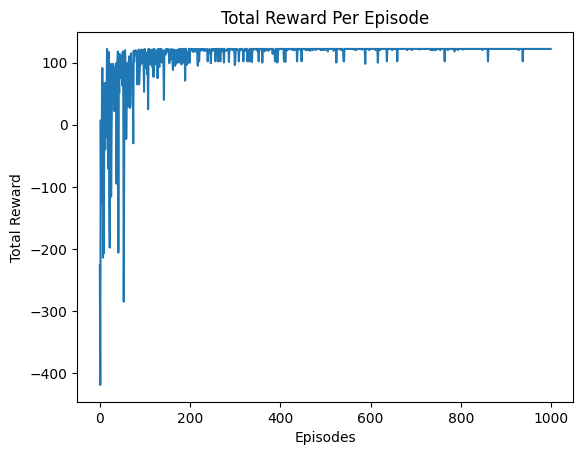

In [131]:
# 3(b) Total reward per episode graph
plt.plot(range(num_episodes), rewards_per_episode)
plt.xlabel("Episodes")
plt.ylabel("Total Reward")
plt.title("Total Reward Per Episode")
plt.show()


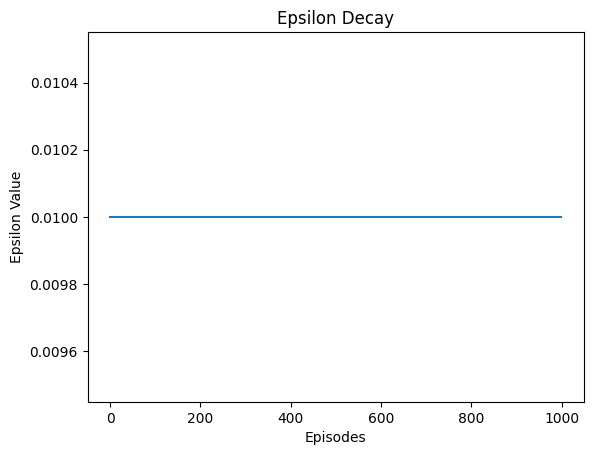

In [132]:
# 3(c): Epsilon decay
epsilon_values = [max(min_epsilon, epsilon * (epsilon_decay ** episode)) for episode in range(num_episodes)]
plt.plot(range(num_episodes), epsilon_values)
plt.xlabel("Episodes")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()


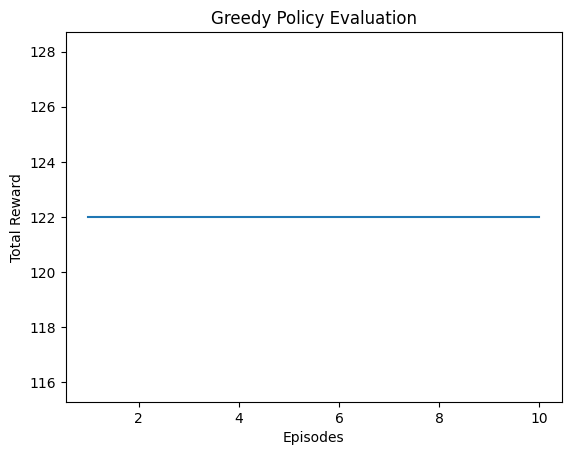

In [136]:
# 3(d): Greedy Policy Evaluation
greedy_rewards = []

for _ in range(10):
    env.reset()
    state = env.current_state
    total_reward = 0
    done = False

    while not done:
        action = max(Q_table[state], key=Q_table[state].get)  # Greedy action
        state, reward, done, status = env.step(action)
        total_reward += reward

    greedy_rewards.append(total_reward)

plt.plot(range(1, 11), greedy_rewards)
plt.xlabel("Episodes")
plt.ylabel("Total Reward")
plt.title("Greedy Policy Evaluation")
plt.show()


**References**
- **Matplotlib (for plotting):**  
  [Matplotlib Documentation](https://matplotlib.org/stable/contents.html)

- **NumPy (for numerical operations):**  
  [NumPy Documentation](https://numpy.org/doc/stable/)

- **Random module (for random actions and exploration):**  
  [Random Module Documentation](https://docs.python.org/3/library/random.html)

- **Python Built-in Functions (for dictionaries, max, etc.):**  
  [Python Built-in Functions](https://docs.python.org/3/library/functions.html)

- **Pillow (for image handling and visualization):**  
  [Pillow Documentation](https://pillow.readthedocs.io/en/stable/)

- **Reinforcement Learning Concepts:**  
  [Reinforcement Learning: An Introduction](http://incompleteideas.net/book/the-book-2nd.html)

- **Images were generated using AI tool DALL-E**
